# Credit Scoring Assignment

### Juan José Medina

## Libraries

In [18]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
from collections import defaultdict
from sklearn.linear_model    import LogisticRegression
from sklearn.ensemble           import RandomForestClassifier
from sklearn.metrics         import *
from sklearn.model_selection import GridSearchCV, train_test_split
from Binning import WOE
from sklearn import preprocessing
from sklearn.svm import SVC

## Load Data

In [66]:
# read dataset
accept = pd.read_csv('./Data/RealEstateLoans_accepts.csv')
reject = pd.read_csv('./Data/RealEstateLoans_rejects.csv')

## Data Exploration
On this step we are going to explore the data with some graphs, to determine its distribution and be able to find missing values and outliers to treat them

In [67]:
accept.head()

,total_income,loan_amount,term,interest_rate,own_car,own_house,nr_children,income_type,education_type,family_status,...,occupation_type,family_count,EXT1,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7,Default
0,157500.0,288562.5,30,3.737395,Y,N,0,Commercial associate,Secondary / secondary special,Married,...,Drivers,2.0,NaN,0.541308,0.236611,0,0,0,0,0
1,76500.0,225000.0,48,3.654300,N,Y,3,Working,Secondary / secondary special,Separated,...,Laborers,4.0,NaN,0.395423,0.673830,0,1,0,0,0
2,67500.0,409653.0,12,3.262865,Y,N,0,Working,Secondary / secondary special,Civil marriage,...,Laborers,2.0,NaN,0.649417,0.042929,0,1,0,0,1
3,180000.0,328405.5,24,4.773736,Y,N,1,Working,Secondary / secondary special,Separated,...,Laborers,2.0,0.512811,0.337838,0.852828,0,1,0,0,0
4,130500.0,1225224.0,60,2.867961,N,N,0,Pensioner,Secondary / secondary special,Married,...,NaN,2.0,0.595440,0.537174,0.367291,0,0,0,0,0


In [68]:
reject.head()

,total_income,loan_amount,term,interest_rate,own_car,own_house,nr_children,income_type,education_type,family_status,...,days_phone_change,occupation_type,family_count,EXT1,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7
0,270000.0,888840.0,48,2.344399,N,Y,1,Commercial associate,Higher education,Married,...,-1866.0,Core staff,3.0,NaN,0.409056,0.687933,0,1,0,0
1,90000.0,562491.0,36,3.195584,N,Y,0,Working,Secondary / secondary special,Married,...,-1821.0,Laborers,2.0,0.398079,0.693795,0.563835,0,1,0,0
2,225000.0,790830.0,48,3.156887,Y,Y,0,Working,Secondary / secondary special,Single / not married,...,0.0,Laborers,1.0,0.023845,0.420569,0.692559,0,1,0,0
3,135000.0,900000.0,42,3.472026,N,N,0,Commercial associate,Secondary / secondary special,Married,...,-1068.0,Sales staff,2.0,NaN,0.108418,0.441836,0,0,0,1
4,67500.0,808650.0,24,2.610668,N,N,0,Pensioner,Secondary / secondary special,Single / not married,...,-488.0,NaN,1.0,NaN,0.508502,0.771362,0,1,0,0


### Missing Values
On the Accept and Reject table, we can see that we have 4 variables with missing values, Occupation, EXT1, EXT2, and EXT3. For EXT2 since the perfectage is low we can drop the rows. for EXT1 since the percentage is more than 50% we decided to drop the variable.


In [69]:
print(accept.isnull().sum()/len(accept)*100)

total_income                0.000000
loan_amount                 0.000000
term                        0.000000
interest_rate               0.000000
own_car                     0.000000
own_house                   0.000000
nr_children                 0.000000
income_type                 0.000000
education_type              0.000000
family_status               0.000000
housing_type                0.000000
region_population_ratio     0.000000
days_birth                  0.000000
days_employed               0.000000
days_registration           0.000000
mobile_number               0.000000
phone_number                0.000000
email                       0.000000
days_phone_change           0.000000
occupation_type            31.926249
family_count                0.000000
EXT1                       56.148579
EXT2                        0.177907
EXT3                       19.623699
EXT4                        0.000000
EXT5                        0.000000
EXT6                        0.000000
E

In [70]:
print(reject.isnull().sum()/len(reject)*100)

total_income                0.000000
loan_amount                 0.000000
term                        0.000000
interest_rate               0.000000
own_car                     0.000000
own_house                   0.000000
nr_children                 0.000000
income_type                 0.000000
education_type              0.000000
family_status               0.000000
housing_type                0.000000
region_population_ratio     0.000000
days_birth                  0.000000
days_employed               0.000000
days_registration           0.000000
mobile_number               0.000000
phone_number                0.000000
email                       0.000000
days_phone_change           0.000000
occupation_type            30.190957
family_count                0.000000
EXT1                       57.868745
EXT2                        0.175593
EXT3                       19.885865
EXT4                        0.000000
EXT5                        0.000000
EXT6                        0.000000
E

In [71]:
accept.drop(columns=["EXT1"],inplace=True)
reject.drop(columns=["EXT1"],inplace=True)

In [72]:
# Boxplots by response
col = 'total_income'

fig = go.Figure()
for val in accept['Default'].unique():
    fig.add_trace(go.Box(x=accept.loc[accept['Default']==val, col], name=f'{col}_{val}'))
fig.show()

In [73]:
# Boxplots by response
col = 'loan_amount'

fig = go.Figure()
for val in accept['Default'].unique():
    fig.add_trace(go.Box(x=accept.loc[accept['Default']==val, col], name=f'{col}_{val}'))
fig.show()

analyzing the plots we can see that there exists outliers on the loan amount and total income, there are people that took up to 4 million in loans, while the mean is around 500k, and for income the mean is around 200k while outliers range up to more than 3.5M, while on the total income there seems to be no visible difference between defaulters and non defaulters.


<AxesSubplot:>

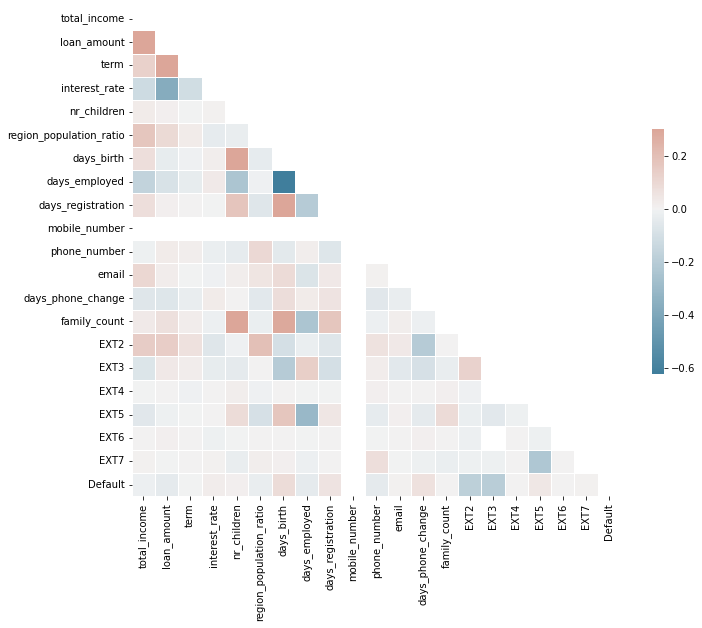

In [74]:
# Compute the correlation matrix
corr = accept.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

Based on the correlation matrix we can see that the variable mobile number has no correlation with the variable, therefore we decided to drop the variable

In [75]:
accept.drop(columns=["mobile_number"],inplace=True)
reject.drop(columns=["mobile_number"],inplace=True)

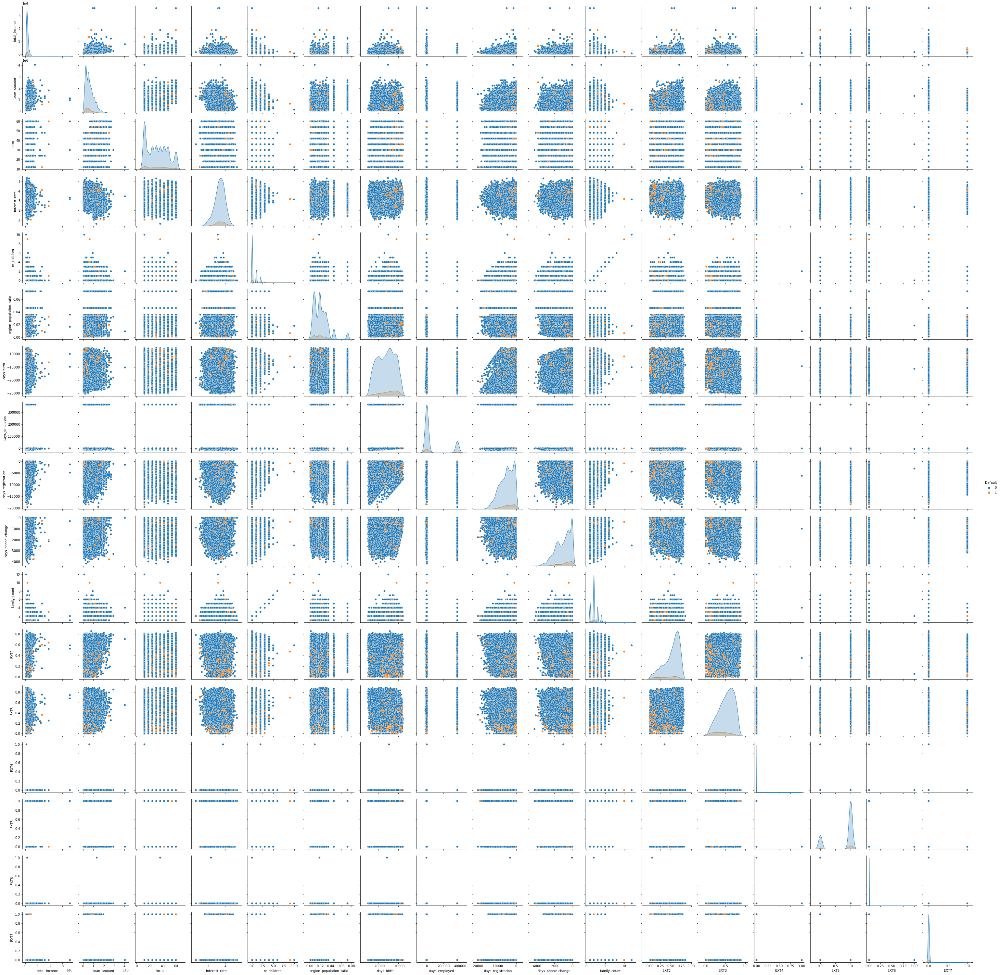

In [84]:
sns.pairplot(accept, hue="Default")

After analyzing the matrix plot and the pairplot, we can see that there exists nocolinearity expect for days employed vs days of birth, the rest are not higly correlated, and on the scatterplots we can make our first assumtion that people with lower income, tends to have a higher probability of default than the rest and they tend to have longer loans 

## Preprocessing 

### Outlier Treatment
For the next step in data cleaning we decided to apply the IQR technique, in this way we delete the rows that contain outliers in all the numerical variables, witht he exception of the EXT variables since they are normalzied

In [77]:
from scipy import stats

cols = ["total_income", "loan_amount","nr_children", "days_birth","days_employed", "days_registration","days_phone_change", "family_count"]

get_iqr = lambda x: {"lower":x.quantile(0.25) - 1.5 * stats.iqr(x), "upper":x.quantile(0.75) + 1.5 * stats.iqr(x)}

# compute iqr
iqr = accept[cols].apply(get_iqr)

# remove outliers
for col, bounds in zip(cols, iqr):
    rows_before = accept.shape[0]
    accept = accept[(accept[col] < bounds["upper"]) & (bounds["lower"] < accept[col])].reset_index(drop=True)
    print(f"{col}: removed {rows_before-accept.shape[0]} rows ...")


total_income: removed 925 rows ...
loan_amount: removed 284 rows ...
nr_children: removed 237 rows ...
days_birth: removed 0 rows ...
days_employed: removed 4238 rows ...
days_registration: removed 9 rows ...
days_phone_change: removed 11 rows ...
family_count: removed 0 rows ...


In [78]:

get_iqr = lambda x: {"lower":x.quantile(0.25) - 1.5 * stats.iqr(x), "upper":x.quantile(0.75) + 1.5 * stats.iqr(x)}

# compute iqr
iqr = reject[cols].apply(get_iqr)

# remove outliers
for col, bounds in zip(cols, iqr):
    rows_before = reject.shape[0]
    reject = reject[(reject[col] < bounds["upper"]) & (bounds["lower"] < reject[col])].reset_index(drop=True)
    print(f"{col}: removed {rows_before-reject.shape[0]} rows ...")


total_income: removed 399 rows ...
loan_amount: removed 147 rows ...
nr_children: removed 110 rows ...
days_birth: removed 0 rows ...
days_employed: removed 1943 rows ...
days_registration: removed 4 rows ...
days_phone_change: removed 13 rows ...
family_count: removed 0 rows ...


In [79]:
accept = accept.dropna(subset=["EXT2"]).reset_index(drop=True)
reject = reject.dropna(subset=["EXT2"]).reset_index(drop=True)

## Preprocessing

### Data Spliting
For data splitting we are going to use a split og 60% for training, 20% for validation and the remaining 20% for test

In [81]:
# train test split
X = accept[accept.columns[~accept.columns.isin(['Default'])]]
y = accept['Default']

#Split data in train (60%), test (40%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, stratify = y, random_state=42)

#Split test in test (20%), validation (20%)
X_test, X_valid, y_test, y_valid = train_test_split(X_test, y_test, test_size=0.5, stratify = y_test, random_state=42)

#Reset Index 
X_train = X_train.reset_index(drop=True)
X_valid = X_valid.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)

y_train = np.array(y_train)
y_valid = np.array(y_valid)
y_test = np.array(y_test)

### Missing Values

Since there are 2 more variables with remaining missing values, we are going to replace the occupation missing values with "unknown", and for the missing EXT3 we are going to replace them with the mean of the train data, also for both of the variables we create another variable to tell us if information was missing or not

In [82]:
X_train["missing_occupation"]=0
X_train["missing_occupation"][X_train["occupation_type"].isna()]=1
X_train["occupation_type"][X_train["occupation_type"].isna()]= "unknown"

X_valid["missing_occupation"]=0
X_valid["missing_occupation"][X_valid["occupation_type"].isna()]=1
X_valid["occupation_type"][X_valid["occupation_type"].isna()]= "unknown"

X_test["missing_occupation"]=0
X_test["missing_occupation"][X_test["occupation_type"].isna()]=1
X_test["occupation_type"][X_test["occupation_type"].isna()]= "unknown"

reject["missing_occupation"]=0
reject["missing_occupation"][reject["occupation_type"].isna()]=1
reject["occupation_type"][reject["occupation_type"].isna()]= "unknown"

X_train["missing_EXT3"]=0
X_train["missing_EXT3"][X_train["EXT3"].isna()]=1
X_train["EXT3"][X_train["EXT3"].isna()]= X_train["EXT3"].mean()

X_valid["missing_EXT3"]=0
X_valid["missing_EXT3"][X_valid["EXT3"].isna()]=1
X_valid["EXT3"][X_valid["EXT3"].isna()]= X_train["EXT3"].mean()

X_test["missing_EXT3"]=0
X_test["missing_EXT3"][X_test["EXT3"].isna()]=1
X_test["EXT3"][X_test["EXT3"].isna()]= X_train["EXT3"].mean()


reject["missing_EXT3"]=0
reject["missing_EXT3"][reject["EXT3"].isna()]=1
reject["EXT3"][reject["EXT3"].isna()]= reject["EXT3"].mean()


C:\Users\lejua\AppData\Local\Temp/ipykernel_15936/1490213111.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lejua\AppData\Local\Temp/ipykernel_15936/1490213111.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lejua\AppData\Local\Temp/ipykernel_15936/1490213111.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lejua\AppData\Local\Temp/ipykernel_15936/1490213111.py:7: SettingWithCopyWarning:


A value

In [84]:
# Class distribution
labels = ["Default - 0", "Default - 1"]
values = np.bincount(y_train)

print(X_train.shape, y_train.shape)
print(np.bincount(y_train))

donut = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5, marker_colors=["rgb(153, 214, 255)", "rgb(0, 92, 153)"])])
donut.show()

(7693, 28) (7693,)
[6942  751]


array(['Core staff', 'Laborers', 'Sales staff', 'Managers', 'unknown',
       'Accountants', 'Cleaning staff', 'Security staff',
       'Private service staff', 'High skill tech staff', 'Drivers',
       'Cooking staff', 'Realty agents', 'Low-skill Laborers', 'HR staff',
       'Medicine staff', 'Waiters/barmen staff', 'IT staff',
       'Secretaries'], dtype=object)

On the class distribution we can see that the defaulters are 9.76% having an unbalanced response rate to fit our predictive model

### Encoding
for encoding our categorical variables we use 2 diferent techniques.
the first is Binning based on the WOE, followed by the input of the WOE
the second is a label encoding.
for the WOE we decide to only use on 2 variables that have the most unique values, to bin them, since the overuse of WOE can lead to leakage from the target variable, and can endup in overfitting the model, for this reason is why we only apply this technique on 2 variables. and for the rest we use a simple label encoder.
We also need to fit the encoding only with the training dataset and the transform the Validation, Test and Reject tables based on the previous fitting.
To decide the number of bins, we need to test the limit to know the threshold on whit we are having the most information per binning and not loosing it, this is done by selecting the higher Iv value

https://towardsdatascience.com/a-data-scientists-toolkit-to-encode-categorical-variables-to-numeric-d17ad9fae03f
https://dev.to/dwalkup/a-primer-on-weight-of-evidence-719


In [85]:
# Apply WOE binning to the "occupation_type" variable
X_trainWOE = X_train.copy()
X_trainWOE["Default"] = y_train
job_woe = WOE.WOEEncoder(pred_var="occupation_type", target_var="Default")
job_woe.fit(X_trainWOE,stop_limit=0.01)
X_train = job_woe.transform(X_train)
X_valid = job_woe.transform(X_valid)
X_test = job_woe.transform(X_test)
reject = job_woe.transform(reject)

Fitted 4 bins for 'occupation_type' (levels=19)...


In [86]:
# test multiple stop limits
job_woe.test_limit(X_trainWOE)

,stop_limit,iv_total,n_bins
0,0.010,0.058227,4
1,0.025,0.058227,4
2,0.050,0.057455,3
3,0.100,0.057455,3


In [87]:
# for continous variables the fit dictionary displays the quantiles
job_dict = job_woe.fit_dict
job_dict

{'Managers': 'occupation_type_1',
 'unknown': 'occupation_type_2',
 'Accountants': 'occupation_type_3',
 'Core staff': 'occupation_type_3',
 'HR staff': 'occupation_type_3',
 'High skill tech staff': 'occupation_type_3',
 'IT staff': 'occupation_type_3',
 'Medicine staff': 'occupation_type_3',
 'Private service staff': 'occupation_type_3',
 'Cleaning staff': 'occupation_type_4',
 'Cooking staff': 'occupation_type_4',
 'Drivers': 'occupation_type_4',
 'Laborers': 'occupation_type_4',
 'Low-skill Laborers': 'occupation_type_4',
 'Realty agents': 'occupation_type_4',
 'Sales staff': 'occupation_type_4',
 'Secretaries': 'occupation_type_4',
 'Security staff': 'occupation_type_4',
 'Waiters/barmen staff': 'occupation_type_4'}

In [88]:
# Apply WOE binning to the "occupation_type" variable
X_trainWOE = X_train.copy()
X_trainWOE["Default"] = y_train
house_woe = WOE.WOEEncoder(pred_var="housing_type", target_var="Default")
house_woe.fit(X_trainWOE,stop_limit=0.01)
X_train = house_woe.transform(X_train)
X_valid = house_woe.transform(X_valid)
X_test = house_woe.transform(X_test)
reject = house_woe.transform(reject)

Fitted 4 bins for 'housing_type' (levels=10)...


In [89]:
# test multiple stop limits
house_woe.test_limit(X_trainWOE)

,stop_limit,iv_total,n_bins
0,0.010,0.027598,4
1,0.025,0.022791,3
2,0.050,0.022791,3
3,0.100,0.022791,3


In [90]:
# for continous variables the fit dictionary displays the quantiles
house_dict = house_woe.fit_dict
house_dict

{'Co-op apartment': 'housing_type_1',
 'Municipal apartment': 'housing_type_1',
 'Co-op house': 'housing_type_2',
 'House': 'housing_type_2',
 'Rented room': 'housing_type_2',
 'Office apartment': 'housing_type_3',
 'Rented apartment': 'housing_type_3',
 'With parents': 'housing_type_3',
 'Apartment': 'housing_type_4',
 'Rented studio': 'housing_type_4'}

In [91]:
from category_encoders import WOEEncoder

# WOE encode JOB and HOUSE
ce_woe = WOEEncoder()
woe_fit = ce_woe.fit(X=X_trainWOE[["occupation_type", "housing_type"]], y=X_trainWOE["Default"])

In [92]:
X_train[["occupation_type", "housing_type"]] = woe_fit.transform(X_train[["occupation_type", "housing_type"]])
X_valid[["occupation_type", "housing_type"]] = woe_fit.transform(X_valid[["occupation_type", "housing_type"]])
X_test[["occupation_type", "housing_type"]] = woe_fit.transform(X_test[["occupation_type", "housing_type"]])
reject[["occupation_type", "housing_type"]] = woe_fit.transform(reject[["occupation_type", "housing_type"]])

In [93]:
cols = ["own_car","own_house","income_type","education_type","family_status"]
for i in cols:
    Lenco = preprocessing.LabelEncoder()
    Lenco.fit(X_train[i])

    X_train[i] =  Lenco.transform(X_train[i])
    X_valid[i] =  Lenco.transform(X_valid[i])
    X_test[i] =  Lenco.transform(X_test[i])
    reject[i] =  Lenco.transform(reject[i])

## Reject Inference
As a bank there is a misslabeling and they reject clients that could have been a good payer, so in order to better train our model we are going to use information from all those clientes that were dennied a loan, and use techniques to merge them into our X_train table
We decided to use 3 diferent techhniques for the reject inference.
The first part is labeling all the rejects as defaulters and then berging it to the training table.
The second method is based on making a predictive model with the training data, then based on those probabilities we select the top 15% and label them as no defaulters.
Finally the third method is letting the predictive model label them based on the cutoff of 0.5

In [94]:
def run_GridSearch(name, data, model, param_grid, **kwargs):
    # save results
    metrics = kwargs.get("metrics", defaultdict(dict))

    #grid search parameters in grid_values
    #scoring is based on roc_auc -> outcome of gs is best model from grid search
    gs = GridSearchCV(model, param_grid = param_grid, scoring = kwargs.get("scoring", 'roc_auc'), cv=kwargs.get("cv", 3), refit=kwargs.get("refit", True))
    gs.fit(data["X_train"], data["y_train"])
    
    # predict
    proba_train   = gs.predict_proba(data["X_train"])[:,1]
    proba_valid   = gs.predict_proba(data["X_valid"])[:,1]

    # evaluate
    metrics[name]["train"] = eval_metrics(proba_train,data["y_train"])
    metrics[name]["valid"] = eval_metrics(proba_valid,data["y_valid"])

    # prints
    if kwargs.get("print", True):
        print(f"{name}: {gs.best_params_}")
        for key, val in metrics[name].items():
            print(f"{key}: ", "\t".join([f"{k}: {v:.4f}" for k,v in val.items()]))

        cmtx = pd.DataFrame(
        confusion_matrix(data["y_valid"], np.round(proba_valid)), 
        index=['true:no', 'true:yes'], 
        columns=['pred:no', 'pred:yes'])

        print(cmtx)
    
    return gs, metrics

In [95]:
# evaluation metrics
def eval_metrics(proba, true):
    proba   = np.asarray(proba)
    true  = np.asarray(true, dtype=int)
    pred    = np.round(proba) # convert proba to binary labels

    auc         = roc_auc_score(true, proba)
    f1          = f1_score(true, pred)

    return {
        'AUC': auc,
        'F1': f1,
    }

### Reject as defaulters
for this method we created a logistic regression model to test the results, as the name says we decided to label all the rejected clienmts as defulters

In [96]:
# Label rejects as defaulters

X_1 = pd.concat([X_train, reject], axis=0).reset_index(drop=True)
y_1 = np.append(y_train, np.ones(reject.shape[0]))

data_temp = {
    "X_train":X_1,
    "y_train":y_1,
    "X_valid":X_valid,
    "y_valid":y_valid,
}

In [97]:
#Setup Grid search for logistic regression model
logistic = LogisticRegression()

models = {"logistic":logistic}

# grid search values 
grid_values = {
                "logistic":{
                    "solver":["liblinear"],
                    'penalty': ['l1', 'l2'],
                    'C':[0.25, 0.5, 1, 3], 
                    "max_iter":[200,300],
                    "class_weight": ["balanced"]
                }
            }

In [98]:
model_dict = defaultdict(dict)
metric_dict = defaultdict(dict)

#loop through models in models dictionary
for name, model in models.items():
    model_dict[name], metric_dict = run_GridSearch(name=name, data=data_temp, model=model, param_grid=grid_values[name], metrics=metric_dict)

logistic: {'C': 0.5, 'class_weight': 'balanced', 'max_iter': 300, 'penalty': 'l1', 'solver': 'liblinear'}
train:  AUC: 0.5812	F1: 0.5540
valid:  AUC: 0.7355	F1: 0.2642
          pred:no  pred:yes
true:no      1323       992
true:yes       61       189


In [99]:
#add model metrics to result dataframe
overview = pd.DataFrame(model_dict["logistic"].cv_results_)

In [100]:
# Refit selected model
model1 = LogisticRegression(**model_dict["logistic"].best_params_)
model1.fit(X_1, y_1)

# Display Model Coefficients
fig = go.Figure([
    go.Bar(y=X_train.columns, x=model1.coef_[0], text=np.round(model1.coef_[0], 2), orientation='h')
    ])

fig.update_traces(textposition='outside', marker_color='rgb(0, 92, 153)')
fig.update_layout(title='Logistic Regression Coefficients',
                  dragmode='select',
                  width=700,
                  height=400,
                  hovermode='closest')
fig.show()

### Based on cutoff
In this method we are going to select the top 15% with the lowest probaility of being defaulters from the reject data, and assume that they would be non defaulters in order to gice more information to our model, on this method we can see that users with a predicted probability of 22.04% or less will be labeled as non defaulters while the rest is defaulters

In [101]:
# original data
data_temp = {
    "X_train":X_train,
    "y_train":y_train,
    "X_valid":X_valid,
    "y_valid":y_valid,
}

model_dict = defaultdict(dict)
metric_dict = defaultdict(dict)

#loop through models in models dictionary
for name, model in models.items():
    model_dict[name], metric_dict = run_GridSearch(name=name, data=data_temp, model=model, param_grid=grid_values[name], metrics=metric_dict)

logistic: {'C': 3, 'class_weight': 'balanced', 'max_iter': 300, 'penalty': 'l1', 'solver': 'liblinear'}
train:  AUC: 0.7407	F1: 0.2837
valid:  AUC: 0.7348	F1: 0.2809
          pred:no  pred:yes
true:no      1555       760
true:yes       85       165


In [102]:
# Refit selected model
model2 = LogisticRegression(**model_dict["logistic"].best_params_)
model2.fit(X_train, y_train)

# Display Model Coefficients
fig = go.Figure([
    go.Bar(y=X_train.columns, x=model2.coef_[0], text=np.round(model2.coef_[0], 2), orientation='h')
    ])

fig.update_traces(textposition='outside', marker_color='rgb(0, 92, 153)')
fig.update_layout(title='Logistic Regression Coefficients',
                  dragmode='select',
                  width=700,
                  height=400,
                  hovermode='closest')
fig.show()

In [103]:
# get probabilities
pred_train = pd.DataFrame(model2.predict_proba(X_train))[1]
pred_reject = pd.DataFrame(model2.predict_proba(reject))[1]


In [114]:
# Label rejects based on cutoff

# Define 15% cutoff
cutoff_15 = int(len(pred_reject) * 0.10)

# Compute cutoff value
cutoff_value = np.max(np.sort(pred_reject)[:cutoff_15])
print("Cutoff probability: {:.3f}%".format(cutoff_value*100))

# Assign "Default" value to rejected loan applicants
y_reject = np.array(pred_reject > cutoff_value, dtype=int)

Cutoff probability: 18.867%


In [115]:
# Incorporate labelled rejects with accepts

X_2 = pd.concat([X_train, reject], axis=0).reset_index(drop=True)
y_2 = np.append(y_train, y_reject)

data_temp = {
    "X_train":X_2,
    "y_train":y_2,
    "X_valid":X_valid,
    "y_valid":y_valid,
}

In [116]:
# Run GridSearch and print best parameters

model_dict = defaultdict(dict)
metric_dict = defaultdict(dict)

#loop through models in models dictionary
for name, model in models.items():
    model_dict[name], metric_dict = run_GridSearch(name=name, data=data_temp, model=model, param_grid=grid_values[name], metrics=metric_dict)

logistic: {'C': 0.25, 'class_weight': 'balanced', 'max_iter': 300, 'penalty': 'l1', 'solver': 'liblinear'}
train:  AUC: 0.6609	F1: 0.5839
valid:  AUC: 0.7340	F1: 0.2626
          pred:no  pred:yes
true:no      1308      1007
true:yes       60       190


In [117]:
# Refit selected model
model3 = LogisticRegression(**model_dict["logistic"].best_params_)
model3.fit(X_2, y_2)

# Display Model Coefficients
fig = go.Figure([
    go.Bar(y=X_train.columns, x=model3.coef_[0], text=np.round(model3.coef_[0], 2), orientation='h')
    ])

fig.update_traces(textposition='outside', marker_color='rgb(0, 92, 153)')
fig.update_layout(title='Logistic Regression Coefficients',
                  dragmode='select',
                  width=700,
                  height=400,
                  hovermode='closest')
fig.show()

### Predicted Label

In [108]:
# Incorporate labelled rejects with accepts

X_3 = pd.concat([X_train, reject], axis=0).reset_index(drop=True)
y_3 = np.append(y_train, np.round(pred_reject))

data_temp = {
    "X_train":X_3,
    "y_train":y_3,
    "X_valid":X_valid,
    "y_valid":y_valid,
}

In [109]:
# Run GridSearch and print best parameters

model_dict = defaultdict(dict)
metric_dict = defaultdict(dict)

#loop through models in models dictionary
for name, model in models.items():
    model_dict[name], metric_dict = run_GridSearch(name=name, data=data_temp, model=model, param_grid=grid_values[name], metrics=metric_dict)

logistic: {'C': 3, 'class_weight': 'balanced', 'max_iter': 300, 'penalty': 'l1', 'solver': 'liblinear'}
train:  AUC: 0.8814	F1: 0.6998
valid:  AUC: 0.7375	F1: 0.2814
          pred:no  pred:yes
true:no      1606       709
true:yes       93       157


In [110]:
# Refit selected model
model4 = LogisticRegression(**model_dict["logistic"].best_params_)
model4.fit(X_3, y_3)

# Display Model Coefficients
fig = go.Figure([
    go.Bar(y=X_train.columns, x=model4.coef_[0], text=np.round(model4.coef_[0], 2), orientation='h')
    ])

fig.update_traces(textposition='outside', marker_color='rgb(0, 92, 153)')
fig.update_layout(title='Logistic Regression Coefficients',
                  dragmode='select',
                  width=700,
                  height=400,
                  hovermode='closest')
fig.show()

### Compare Models
After creating models to test our diferent methods we get the results based on the AUC anf F1 metrics.
All the models performed similar, having a AUC of  0.73 and F1 score of 0.27, even in this scenario, the Cutoff model was marginally better thatn the rest , having a AUC of  0.7347 and F1 Score of 0.28. The F1 score is relative low.
After this we select the best model applyting the transformation and the merge

In [118]:
model_overview = {
    "All default": model1,
    "Cutoff": model2,
    "Proba": model3
}

In [119]:
res_dict = defaultdict()

for name, model in model_overview.items():

    #Predict values for test set
    proba_test   = model.predict_proba(X_valid)[:,1]

    #compute evaluation metrics
    res_dict[name] = eval_metrics(proba_test, y_valid)
    res_dict[name]["params"] = model.get_params()

# display overview
pd.DataFrame(res_dict).T.sort_values("AUC", ascending=False)

,AUC,F1,params
All default,0.735883,0.265734,"{'C': 0.5, 'class_weight': 'balanced', 'dual':..."
Cutoff,0.734763,0.280851,"{'C': 3, 'class_weight': 'balanced', 'dual': F..."
Proba,0.733809,0.262069,"{'C': 0.25, 'class_weight': 'balanced', 'dual'..."


### Select best model

In [120]:
X_train = X_2
y_train = y_2

## Cost Sensitivity
As a business we want to reduce the cost of assigning False Positives, beacause they are more likely to be defaulters, and also we want to reduce the cost of assigning False Negatives, so we dont reject costumers that are likely to pay all the loan, therefore loosing the cost of oportunity, in order to to this we created a cost matrix based on Annuity, Present Value and Future value, wiith a Risk free interest rate of 1.5% and a loss given default of 75% meaning that clinets on average only pay 25% of their loan.

In [121]:
# Annuity
def A(am, ir_c, n):
    return am * (ir_c*(1+ir_c)**n) / ((1+ir_c)**n - 1)

# Present Value
def PV(A, ir_rf, n):
    return A * (1-1/((1+ir_rf)**n)) / ir_rf

# Future Value
def FV(am, ir, n):
    return am * (1+ir)**n

def cost_FP(am, n, ir_c, ir_rf=0.015):
    return PV(A(am,ir_c,n),ir_rf,n) - am

def cost_FN(am, lgd=0.75):
    return am*lgd





def total_cost(true, pred, cTP, cFN, cFP, cTN):
    return true*(pred*cTP+(1-pred)*cFN)+(1-true)*(pred*cFP+(1-pred)*cTN)

In [122]:
# compute cost matrix
# transform months -> years

cm_train = pd.DataFrame()
cm_train["cFP"] = cost_FP(X_train["loan_amount"], X_train["term"]/12, X_train["interest_rate"]/100)
cm_train["cFN"] = cost_FN(X_train["loan_amount"])
cm_train["cTP"] = 0.0
cm_train["cTN"] = 0.0

cm_valid = pd.DataFrame()
cm_valid["cFP"] = cost_FP(X_valid["loan_amount"], X_valid["term"]/12, X_valid["interest_rate"]/100)
cm_valid["cFN"] = cost_FN(X_valid["loan_amount"])
cm_valid["cTP"] = 0.0
cm_valid["cTN"] = 0.0

cm_test = pd.DataFrame()
cm_test["cFP"] = cost_FP(X_test["loan_amount"], X_test["term"]/12, X_test["interest_rate"]/100)
cm_test["cFN"] = cost_FN(X_test["loan_amount"])
cm_test["cTP"] = 0.0
cm_test["cTN"] = 0.0

In [123]:
# Average cost
weights_avg_cost = {0:1, 1:(cm_train["cFN"].mean() / cm_train["cFP"].mean())}
print("Avg. cost:", weights_avg_cost)

# Inverse class distribution
c0, c1 = np.bincount(y_train)
weights_inv = {0:1,1:c0/c1}
print("Inv. class distribution:", weights_inv)

Avg. cost: {0: 1, 1: 22.602283639550087}
Inv. class distribution: {0: 1, 1: 1.1515703231679564}


## Modeling
We created 2 different models, the first one is a logistic Regression, and the second model is a Random forest, each of these models is applied to a grid search in order to improve the model. 
the metrics that we want to analize are the AUC, the F1 and the cost that is extracted from the matrix created before.
the moment when we did the reject inference the ratio of the defults changed from the 9% of defaulters to 46.5%, therefore we choose to set the weight as "balanced" rather than applying a customized weight.
After analizing the results we choose the best model

In [125]:
# Class distribution
labels = ["Default - 0", "Default - 1"]
values = np.bincount(y_train)

print(X_train.shape, y_train.shape)
print(np.bincount(y_train))

donut = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5, marker_colors=["rgb(153, 214, 255)", "rgb(0, 92, 153)"])])
donut.show()

(14181, 28) (14181,)
[7590 6591]


In [126]:
def eval_metrics(proba, true, cm, t=0.5):
    proba = np.asarray(proba)
    true = np.asarray(true, dtype=int)
    pred = np.array(proba > t, dtype=int) # probability threshold

    auc = roc_auc_score(true, proba)
    f1 = f1_score(true, pred)
    cost = np.sum(total_cost(true, pred, **cm))

    return {
        'AUC': auc,
        'F1': f1,
        "Cost": cost,
    }

In [127]:
#Setup Grid search for logistic regression model
logistic = LogisticRegression(random_state=123)
rf = RandomForestClassifier(random_state=123)


models = {"logistic":logistic, "rf":rf}

# grid search values 
grid_values = {
                "logistic":{
                    "solver":["liblinear"],
                    'penalty': ['l1', 'l2'],
                    'C':[0.25, 0.5, 1, 3], 
                    "max_iter":[200,300],
                    "class_weight": ["balanced"] # can be extended to custom class weights
                },
                "rf":{
                    "max_depth":np.arange(2,11,1),
                    "class_weight": ["balanced"] # can be extended to custom class weights
                }
            }

In [128]:
def run_GridSearch(name, data, model, param_grid, **kwargs):
    # save results
    metrics = kwargs.get("metrics", defaultdict(dict))

    #grid search parameters in grid_values
    #scoring is based on roc_auc -> outcome of gs is best model from grid search
    gs = GridSearchCV(model, param_grid = param_grid, scoring = kwargs.get("scoring", 'roc_auc'), cv=kwargs.get("cv", 3), refit=kwargs.get("refit", True),n_jobs=-2)
    gs.fit(data["X_train"], data["y_train"])
    
    # predict
    proba_train   = gs.predict_proba(data["X_train"])[:,1]
    proba_valid   = gs.predict_proba(data["X_valid"])[:,1]

    # evaluate
    metrics[name]["train"] = eval_metrics(proba_train,data["y_train"],data["cm_train"])
    metrics[name]["valid"] = eval_metrics(proba_valid,data["y_valid"],data["cm_valid"])

    # prints
    if kwargs.get("print", True):
        print(f"{name}: {gs.best_params_}")
        for key, val in metrics[name].items():
            print(f"{key}: ", "\t".join([f"{k}: {v:.4f}" for k,v in val.items()]))

        cmtx = pd.DataFrame(
        confusion_matrix(data["y_valid"], np.round(proba_valid)), 
        index=['true:no', 'true:yes'], 
        columns=['pred:no', 'pred:yes'])

        print(cmtx)
    
    return gs, metrics

In [129]:
data_temp = {
    "X_train":X_train,
    "y_train":y_train,
    "X_valid":X_valid,
    "y_valid":y_valid,
    "cm_train":cm_train,
    "cm_valid":cm_valid,
}

model_dict = defaultdict(dict)
metric_dict = defaultdict(dict)

#loop through models in models dictionary
for name, model in models.items():
    model_dict[name], metric_dict = run_GridSearch(name=name, data=data_temp, model=model, param_grid=grid_values[name], metrics=metric_dict)

logistic: {'C': 0.5, 'class_weight': 'balanced', 'max_iter': 200, 'penalty': 'l1', 'solver': 'liblinear'}
train:  AUC: 0.6610	F1: 0.5848	Cost: 1287557386.8078
valid:  AUC: 0.7343	F1: 0.2614	Cost: 47319697.3697
          pred:no  pred:yes
true:no      1308      1007
true:yes       61       189
rf: {'class_weight': 'balanced', 'max_depth': 9}
train:  AUC: 0.8693	F1: 0.7604	Cost: 630457557.7741
valid:  AUC: 0.6367	F1: 0.2315	Cost: 57277804.9549
          pred:no  pred:yes
true:no      1480       835
true:yes      108       142


In [130]:
modelFinal = LogisticRegression(C= 1, class_weight= 'balanced', max_iter= 200, penalty= 'l1', solver= 'liblinear',random_state=123)
modelFinal.fit(X_train, y_train)

LogisticRegression(C=1, class_weight='balanced', max_iter=200, penalty='l1',
                   random_state=123, solver='liblinear')

In [131]:
# Display Model Coefficients
fig = go.Figure([
    go.Bar(y=X_train.columns, x=modelFinal.coef_[0], text=np.round(modelFinal.coef_[0], 2), orientation='h')
    ])

fig.update_traces(textposition='outside', marker_color='rgb(0, 92, 153)')
fig.update_layout(title='Logistic Regression Coefficients',
                  dragmode='select',
                  width=700,
                  height=400,
                  hovermode='closest')
fig.show()

After running the grid search we can see that the Logistic model have better results, having a higher ACU and F1 score, also having a lower cost, so the next step will be to set a threshold in order to minimize the cost

### Cutoff Optimization
Since we want to minimize the operational risk and the cost, we want to know which is the better threshold to separate the labels based on the probablilities of being a defaulter, in this experiment we set multiple  thresholds from 0 to 1 in increments of  0.001, and analyze the costo that eachone is giving, then we select the best one that has the lowest cost

In [132]:
def tune_threshold(true, proba, cm):
    thresholds = np.arange(0, 1, 0.001)
    costs = [np.sum(total_cost(true, np.array(proba > t, dtype=int), **cm)) for t in thresholds]
    return thresholds, costs

In [153]:
# save performance validation
EVAL = metric_dict.copy()

# evaluate on test set
EVAL["logistic"]["test"] = eval_metrics(modelFinal.predict_proba(X_test)[:,1], y_test, cm_test)


In [168]:
# Logistic Regression

thresholds, costs = tune_threshold(y_valid, modelFinal.predict_proba(X_valid)[:,1], cm_valid)

# best threshold
index = np.argmin(costs)
print(f"Threshold: {thresholds[index]:.3f}\tCost: {costs[index]:.0f}")

# evaluate cutoff on all data sets
EVAL["logistic+cutoff"]["train"] = eval_metrics(model_dict["logistic"].predict_proba(X_train)[:,1], y_train, cm_train, t=thresholds[np.argmin(costs)])
EVAL["logistic+cutoff"]["valid"] = eval_metrics(model_dict["logistic"].predict_proba(X_valid)[:,1], y_valid, cm_valid, t=thresholds[np.argmin(costs)])
EVAL["logistic+cutoff"]["test"] = eval_metrics(model_dict["logistic"].predict_proba(X_test)[:,1], y_test, cm_test, t=thresholds[np.argmin(costs)])
print(EVAL["logistic+cutoff"])

# Number of accepted applicants = pred:no = 367
cmtx = pd.DataFrame(
        confusion_matrix(y_test, np.array(modelFinal.predict_proba(X_test)[:,1] > thresholds[np.argmin(costs)], dtype=int)), 
        index=['true:no', 'true:yes'], 
        columns=['pred:no', 'pred:yes'])
print(cmtx)

Threshold: 0.422	Cost: 35970644
{'train': {'AUC': 0.6609716127853509, 'F1': 0.6435030348073827, 'Cost': 746273771.3903577}, 'valid': {'AUC': 0.7342669546436285, 'F1': 0.2401247401247401, 'Cost': 36059484.166133106}, 'test': {'AUC': 0.7365183585313174, 'F1': 0.23280423280423282, 'Cost': 41012928.0418066}}
          pred:no  pred:yes
true:no       891      1424
true:yes       30       220


In [169]:
# Plot cost for all cutoffs
fig = go.Figure(data=go.Scatter(x=thresholds, y=costs))
fig.add_hline(y=np.min(costs), line_dash="dot", line_color="black")
fig.add_vline(x=thresholds[np.argmin(costs)], line_dash="dot", line_color="black")
fig.update_layout(
    title="Logistic Regression",
    xaxis_title="Threshold",
    yaxis_title="Cost"
)
fig.show()


After running the experiment on our validation data to know at which probability we assign a customer as defaulter,  we are able to see that in order to reduce the cost the best cutoff is 42% , in this scenario from the results that we got from the validation data the cost would be 35 Millions, after this breaking point the cost rapidly starts to increase.
So as a business we are only going to give a loan to those who have a prbability of loaning of 42% and lower in order to reduce the risk of them being defulters and reducing the costs associated to it. for our test data with the cutoff of 42% we get a AUC of 0.73 and a cost of 42 million, similar to the validation test.

## Score Board
The final step is creating a scoreboard, giving the coeficients from the logistic regression to each variable, we are able to get the predicted score for each user, and the individual score for each variable assigned to each user

In [136]:
modelFinal.coef_

array([[ 7.03025803e-07, -1.23395770e-07,  3.75934491e-03,
         6.12680041e-02, -1.66330329e-01,  3.67054634e-02,
         1.57404826e-01,  1.68059864e-02,  6.93852796e-02,
        -2.98805228e-02,  0.00000000e+00,  0.00000000e+00,
        -4.75966922e-06,  8.50621209e-05,  2.96823184e-05,
        -2.48609420e-01,  6.09296992e-02,  6.74214869e-06,
         4.03982309e-01, -9.34399120e-02, -1.46492797e+00,
        -2.17526426e+00,  0.00000000e+00,  2.43458695e-01,
         0.00000000e+00,  1.17016146e-01, -4.06834466e-02,
         1.81150319e-01]])

In [142]:
# Example:

def score_func(logit, params, intercept, target=850, target_odds=95, pdo=45):
    """
    Data-driven application scoring function.
    Inspired by: https://blogs.sas.com/content/subconsciousmusings/2019/01/18/building-credit-scorecards-using-statistical-methods-and-business-logic/
    """
    
    factor = pdo / np.log(2)
    offset = target - factor * np.log(target_odds)

    # regression model predicts default, therefore: factor*logit is deducted from offset
    score  = offset/params - factor * (logit + intercept/params)
    
    return score

In [143]:
# get model intercept
ic = model_overview["Proba"].intercept_.item()

# compute log odds (coef * value)
df_logit = X_test * modelFinal.coef_
# compute score for all applicants
df_score = score_func(df_logit, df_logit.shape[1], ic)

# compute row sums (total score per applicant) and sort values
sum_sort = np.sort(np.sum(df_score, axis=1))

In [140]:
fig = go.Figure()

for i in np.arange(5, 50, 5):
    df_score = score_func(df_logit, df_logit.shape[1], ic, pdo=i)
    sum_sort = np.sort(np.sum(df_score, axis=1))

    fig.add_trace(go.Scatter(x=sum_sort, y=np.cumsum(sum_sort)/sum(sum_sort), mode='lines', name=f"pdo={i}"))

fig.show()

In [141]:
fig = go.Figure()

for i in np.arange(5, 101, 10):
    df_score = score_func(df_logit, df_logit.shape[1], ic, target_odds=i,pdo=45)
    sum_sort = np.sort(np.sum(df_score, axis=1))

    fig.add_trace(go.Scatter(x=sum_sort, y=np.cumsum(sum_sort)/sum(sum_sort), mode='lines', name=f"target_odds={i}"))

fig.show()

In order to decide the best pdo parameter, we plot the cummulative distribution of the scores, and try to get the biggest length of the distribution, so if the pdo is too low, everyone will be scored from 800 up to 850, and that scenario is unrealistic, we want to have the distribution of the scores the closest to a normal distribution, after analyzing the graphs we decided to use a pdo of 45, since we will get  scores from a range of 450 to 750 and targeted odds of 95, so the worst clients are assigned a low score and the best will be assigned around 750

In [144]:
df_score

,total_income,loan_amount,term,interest_rate,own_car,own_house,nr_children,income_type,education_type,family_status,...,occupation_type,family_count,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7,missing_occupation,missing_EXT3
0,13.190063,21.664104,7.047201,8.718246,17.297783,17.297783,17.297783,16.206717,-0.720541,23.117428,...,27.922296,23.364021,84.187164,92.636556,17.297783,1.492133,17.297783,17.297783,17.297783,17.297783
1,12.779291,18.236369,14.369045,2.533740,17.297783,14.914817,17.297783,14.024585,-0.720541,19.237664,...,27.922296,29.430260,59.370935,86.835194,17.297783,1.492133,17.297783,17.297783,17.297783,5.537273
2,4.974623,23.549279,9.975939,5.239825,17.297783,14.914817,17.297783,17.297783,12.793202,17.297783,...,23.282132,29.430260,79.834282,67.521414,17.297783,1.492133,17.297783,17.297783,17.297783,17.297783
3,6.001553,20.902738,5.582832,5.204318,17.297783,17.297783,17.297783,14.024585,-0.720541,19.237664,...,20.158118,29.430260,60.265968,98.421670,17.297783,1.492133,17.297783,17.297783,19.939004,17.297783
4,4.974623,22.044787,14.369045,5.062343,28.096160,17.297783,17.297783,14.024585,12.793202,19.237664,...,23.282132,29.430260,77.449776,95.667883,17.297783,1.492133,17.297783,17.297783,17.297783,17.297783
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2560,9.493115,21.010886,12.904676,4.909153,17.297783,14.914817,17.297783,14.024585,-0.720541,19.237664,...,12.433016,29.430260,73.954528,93.649509,17.297783,1.492133,17.297783,17.297783,17.297783,17.297783
2561,11.136203,20.001499,14.369045,3.818057,17.297783,17.297783,17.297783,14.024585,12.793202,23.117428,...,27.922296,23.364021,40.783026,85.768961,17.297783,1.492133,17.297783,17.297783,17.297783,17.297783
2562,4.974623,29.535235,8.511570,1.940005,17.297783,17.297783,17.297783,14.024585,-0.720541,25.057310,...,27.922296,23.364021,79.516975,68.458914,17.297783,1.492133,17.297783,17.297783,17.297783,17.297783
2563,13.600835,21.515508,7.047201,1.593781,17.297783,17.297783,17.297783,14.024585,-0.720541,17.297783,...,20.158118,29.430260,78.952523,64.756704,17.297783,1.492133,17.297783,17.297783,19.939004,17.297783


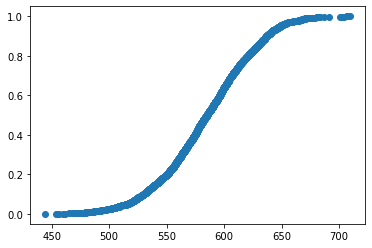

In [145]:
plt.scatter(sum_sort, np.cumsum(sum_sort)/sum(sum_sort))

In [146]:
# Average impact of the variables on the score
df_score.mean().sort_values(ascending = False)

EXT3                       87.139321
EXT2                       65.410474
family_count               30.856358
days_employed              28.143046
days_registration          26.188293
loan_amount                22.043928
phone_number               21.608086
own_car                    21.516096
family_status              19.823032
occupation_type            17.910343
missing_occupation         17.740561
days_phone_change          17.716608
EXT6                       17.297783
EXT4                       17.297783
region_population_ratio    17.297783
housing_type               17.297783
EXT7                       17.167467
email                      17.051038
own_house                  15.757449
income_type                15.102464
missing_EXT3               15.023626
days_birth                 12.814592
nr_children                12.604648
total_income                9.977344
term                        9.761279
interest_rate               3.905194
EXT5                        3.864521
e

<AxesSubplot:ylabel='Count'>

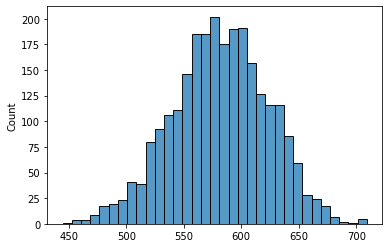

In [147]:
sns.histplot(np.sum(df_score, axis=1))

After making the scoring board we can see the distribution of all users, most of them have a credit score of around 575, and then we a normal distribution of the scores.
We can also see the weight or the impact that every variable have on the scoring, we are able to inferre that the most important are the EXT2 and EXT 3  variables, after those 2 that are encoded, we can see that the total number of family members have a high impact on the score model, while on the other hand we have that edducation type has a low impoact on the score, followed by EXt5, and the number of months that the loan was requested

In [148]:
df_score["Total_Score"] = df_score.sum(axis=1)

df_score_eval = pd.concat([df_score, pd.DataFrame(y_test,columns=["Default"])], axis=1)

df_score_eval = df_score_eval[["Total_Score","Default"]]

df_score_eval["bins"] = pd.cut(df_score_eval["Total_Score"],bins= [350,400,450,500,550,600,650, 700, 750])

df_score_eval = pd.concat([df_score_eval,pd.get_dummies(df_score_eval["Default"],prefix="Default")],axis=1)
df_score_eval= df_score_eval[["Total_Score","bins","Default_0","Default_1"]]
df_score_eval

,Total_Score,bins,Default_0,Default_1
0,616.849258,"(600, 650]",1,0
1,551.535274,"(550, 600]",1,0
2,586.551662,"(550, 600]",1,0
3,604.228128,"(600, 650]",1,0
4,649.306889,"(600, 650]",1,0
...,...,...,...,...
2560,584.695626,"(550, 600]",1,0
2561,555.950069,"(550, 600]",0,1
2562,582.548518,"(550, 600]",1,0
2563,578.228024,"(550, 600]",1,0


In [149]:
df_score_eval2= df_score_eval.groupby(by="bins").sum()
df_score_eval2["ratio_default"] = (df_score_eval2["Default_1"] / (df_score_eval2["Default_1"]+df_score_eval2["Default_0"]))
df_score_eval2 = df_score_eval2.reset_index()
df_score_eval2.drop(columns="Total_Score",inplace = True)
df_score_eval2


,bins,Default_0,Default_1,ratio_default
0,"(350, 400]",0.0,0.0,NaN
1,"(400, 450]",1.0,0.0,0.000000
2,"(450, 500]",51.0,22.0,0.301370
3,"(500, 550]",388.0,107.0,0.216162
4,"(550, 600]",1043.0,94.0,0.082674
5,"(600, 650]",733.0,26.0,0.034256
6,"(650, 700]",93.0,1.0,0.010638
7,"(700, 750]",6.0,0.0,0.000000


We can see that clients with a score from 550 onwards are less likely to default, with a probability of 8.26% with a score of 550-600, and the better the score the less pthe probability of defaulting.
we can also see that as soon as the score is lower than 550 we probability rises by a big margin, for clients with a score of 500-550, there were 21.62% that defaulted and on the next loer bin it rises to 30%

In [150]:
df_score_eval3 = df_score_eval.merge(df_score_eval2,on="bins",how="left")


<AxesSubplot:xlabel='Total_Score', ylabel='Count'>

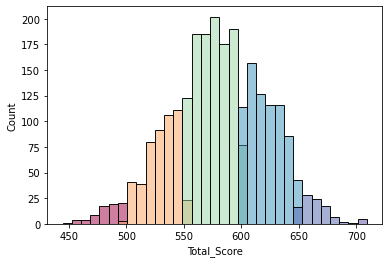

In [151]:
colr = sns.color_palette("Spectral", as_cmap=True)
colr = colr.reversed()
sns.histplot(df_score_eval3,x="Total_Score",hue="ratio_default",palette =colr,legend=False)


Now we are able to view the distribution of the scores along the risk they carry based on colors, we see taht all the greens are good to be given a loan up to color purple, and from yellow, red and black, there is a greater risk of defulting

In [146]:
#Custom fucntions were used with the code provided by Professor Philipp Borchert